In [1]:
# Packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
import os
# sns.set()

# To standardize features
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# To locate files
import tkinter as tk
from tkinter import filedialog
from mat4py import loadmat

#Extras
from mpl_toolkits.mplot3d import Axes3D
import plotly.express as pxb
import csv
from collections import defaultdict

In [2]:
dfID = "rtPMTM_magnitude_temporal"
# dfID = "lfp_nex_pcaNoiseRm"
DF = {}
params = defaultdict(lambda: defaultdict(lambda: defaultdict(dict)))
params["paths"]["Data"]["FTR"]["local"]="/media/user/Expansion/nCORTEx_local/Project_Neuromodulation-For-Pain/Experiments/JOLT/Data/FTR/"
dataPath = os.path.join(params["paths"]["Data"]["FTR"]["local"],"TRAIN",dfID)
params["paths"]["dataPath"] = dataPath

# load new dataset (from current dfID)
X_import_path = os.path.join(dataPath, "X.csv")
Y_import_path = os.path.join(dataPath, "Y.csv")


# # Read the CSV file manually using the csv module
# with open(X_import_path, 'r') as f:
#     reader = csv.reader(f)
#     rows = [row for row in reader]

# # Determine the maximum row length
# max_length = max(len(row) for row in rows)

# # Pad rows that are shorter with None (or NaN)
# for row in rows:
#     row.extend([None] * (max_length - len(row)))

# # Now create a DataFrame from the padded rows
# DF["X"] = pd.DataFrame(rows)
DF["X"] = pd.read_csv(X_import_path, header=None)
DF["Y"] = pd.read_csv(Y_import_path, header=None)

/tmp/ipykernel_3609345/519127854.py:29: DtypeWarning: Columns (0,1,2,3,4,5) have mixed types. Specify dtype option on import or set low_memory=False.
  DF["Y"] = pd.read_csv(Y_import_path, header=None)


In [34]:
# Ensure Y's header row (index 0) is always included
header_idx = [0]  # Always include the first row of Y

# Randomly select 1% of the remaining rows
remaining_indices_Y = DF["Y"].index[1:]  # Exclude index 0
subRowsIdx = np.random.choice(remaining_indices_Y, size=int(0.02 * len(DF["X"])), replace=False)
# Combine the header index and random selection
final_indices = np.concatenate([header_idx, subRowsIdx])
# subRowsIdx_X = np.random.choice(DF["X"].index, size=int(0.1 * len(DF["X"])), replace=False)



# Create the sub-selection
DF_in = {}
DF_in["X"] = DF["X"].iloc[subRowsIdx].reset_index(drop=True)
DF_in["Y"] = DF["Y"].iloc[final_indices].reset_index(drop=True)
print(DF_in["X"].shape)
print(DF_in["Y"].shape)
print(DF["Y"].iloc[1,:])


(537600, 110)
(537601, 6)
0    0
1    1
2    1
3    1
4    1
5    1
Name: 1, dtype: object


In [ ]:
# # Y_in = DF_in["Y"]
# # SUBSELECT LABELS
# fMin = 0
# fMax = 50
# freqCol = DF_in["Y"].iloc[1:,0].astype(int) # frequency (channel/frequency are swapped)
# fSelCond = (freqCol >= fMin) & (freqCol <= fMax)
# # freqSelIdx = freqIdx[fSelCond]
# DF_in["X"] = DF_in["X"].iloc[fSelCond.to_numpy(),:]
# # Keep the first row of "Y" and filter the rest
# DF_in["Y"] = pd.concat([
#     DF_in["Y"].iloc[[0]],  # Preserve the first row
#     DF_in["Y"].iloc[1:].iloc[fSelCond.to_numpy(), :]
# ], ignore_index=True)


In [ ]:
# import cupy as cp
# from embedPCA import embedPCA
# # Convert DataFrame to CuPy array
# DF_in_gpu = {}
# DF_in_gpu["X"] = cp.asarray(DF_in["X"].to_numpy())  # Move to GPU
# DF_in_gpu["Y"] = DF_in["Y"]  # Move to GPU

# # Run embedPCA with GPU-based data
# args = {"n_components": 10}
# DF_postOp_gpu = embedPCA(DF_in_gpu, args)

# # Convert back to a Pandas DataFrame if needed
# # DF_postOp = pd.DataFrame(cp.asnumpy(DF_postOp_gpu))  # Move back to CPU
# DF_postOp = {}
# DF_postOp["X"] = pd.DataFrame(cp.asnumpy(DF_postOp_gpu["X"]))
# DF_postOp["X"] = DF_postOp_gpu["Y"]


In [15]:
from embedPCA import embedPCA
args={}
args["n_components"]=10
DF_postOp = embedPCA(DF_in,args)

In [40]:
from embedUMAP import embedUMAP
args={}
args["n_components"] = 3  # default = 2
args["n_neighbors"] = 100  # default = 15
args["min_dist"] = 0.5  # default = 0.1
params["embedArgs"] = args
params["embedMethod"] = "embedUMAP"
DF_postOp = embedUMAP(DF_in, args)

/home/user/miniconda3/envs/nexus/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.



In [21]:

import importlib
from nexPy_generateArgsLabel import nexPy_generateArgsLabel
# importlib.reload(nexPy_generateArgsLabel)
argsLabel = nexPy_generateArgsLabel(args)
print(argsLabel)

_n-components--3_n-neighbors--10_min-dist--0.1


In [37]:
from nexPy_exportEmbedding import nexPy_exportEmbedding
params["embedMethod"] = "embedUMAP"
params["embedArgs"] = args
nexPy_exportEmbedding(DF_postOp, params)

In [ ]:
# argsLabel = ""
# for k, v in args.items():        
#     k = k.replace("_","-")
#     if isinstance(v,(int,float)):
#         v = str(v)            
#         v = v.replace(".","p")            
#     argsLabel = argsLabel + "_{}--{}".format(k,v) 
# print(argsLabel)

_n-components--3_n-neighbors--10_min-dist--0p1


In [41]:

import plotly.graph_objs as go
import nbformat
# import plotly.io as pio
# pio.renderers.default = 'notebook'

x_data = DF_postOp["df"][:,0]
y_data = DF_postOp["df"][:,1]
z_data = DF_postOp["df"][:,2]
Y = DF_postOp["Y"]
labelSel=1
print(Y.columns)
labelSelIdx = np.where(Y.columns == labelSel)[0][0]  # First matching index
# Extract color values based on the selected label
C = Y.iloc[1:, labelSelIdx].astype(int)

# Ensure C has the same length as the number of data points
if len(C) != len(x_data):
    raise ValueError("The length of C must match the number of data points.")

# Create the scatter trace with the color scale
trace = go.Scatter3d(
    x=x_data,  # X data
    y=y_data,  # Y data
    z=z_data,  # Z data
    mode='markers',
    marker=dict(
        size=2,
        color=C,  # Use C for coloring the points
        colorscale='Rainbow',  # Choose the colorscale
        opacity=0.8,
        colorbar=dict(
            title="Color Scale",  # Title for the color bar
            tickvals=np.linspace(min(C), max(C), 6),  # Define more ticks between min and max
            ticktext=[f'{int(val)}' for val in np.linspace(min(C), max(C), 6)]  # Optional: Custom tick labels
        )
    )
)

# Define the layout for the 3D plot
layout = go.Layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title="Interactive 3D Scatter Plot"
)

# Create the figure and plot it
figure = go.Figure(data=[trace], layout=layout)

# Plot the figure in the shell
figure.show()  # This will render the plot interactively

Index([0, 1, 2, 3, 4, 5], dtype='int64')


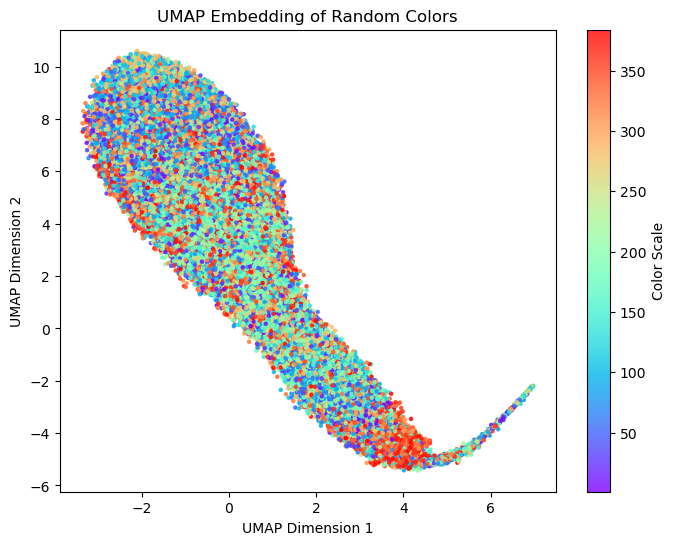

In [42]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming u is the UMAP embedding (N x 2) and data contains color values
u = DF_postOp["df"][:, :2]  # Extract first two dimensions for 2D visualization
Y = DF_postOp["Y"]
labelSel = 1

# Find the corresponding label index
labelSelIdx = np.where(Y.columns == labelSel)[0][0]  # First matching index

# Extract color values based on the selected label
data = Y.iloc[1:, labelSelIdx].astype(int)

# Ensure data has the correct length
if len(data) != len(u):
    raise ValueError("The length of data must match the number of points in u.")

# Create the scatter plot
plt.figure(figsize=(8, 6))
plt.scatter(u[:, 0], u[:, 1], c=data, cmap='rainbow', s=5, alpha=0.8)

# Add colorbar
plt.colorbar(label="Color Scale")

# Title and labels
plt.title("UMAP Embedding of Random Colors")
plt.xlabel("UMAP Dimension 1")
plt.ylabel("UMAP Dimension 2")

# Show plot
plt.show()


In [43]:

import plotly.graph_objs as go
import nbformat
# import plotly.io as pio
# pio.renderers.default = 'notebook'

x_data = DF_postOp["df"][:,0]
y_data = DF_postOp["df"][:,1]
z_data = DF_postOp["df"][:,2]
Y = DF_postOp["Y"]
labelSel=0
print(Y.columns)
labelSelIdx = np.where(Y.columns == labelSel)[0][0]  # First matching index
# Extract color values based on the selected label
C = Y.iloc[1:, labelSelIdx].astype(int)

# Ensure C has the same length as the number of data points
if len(C) != len(x_data):
    raise ValueError("The length of C must match the number of data points.")

# Create the scatter trace with the color scale
trace = go.Scatter3d(
    x=x_data,  # X data
    y=y_data,  # Y data
    z=z_data,  # Z data
    mode='markers',
    marker=dict(
        size=2,
        color=C,  # Use C for coloring the points
        colorscale='Rainbow',  # Choose the colorscale
        opacity=0.8,
        colorbar=dict(
            title="Color Scale",  # Title for the color bar
            tickvals=np.linspace(min(C), max(C), 6),  # Define more ticks between min and max
            ticktext=[f'{int(val)}' for val in np.linspace(min(C), max(C), 6)]  # Optional: Custom tick labels
        )
    )
)

# Define the layout for the 3D plot
layout = go.Layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title="Interactive 3D Scatter Plot"
)

# Create the figure and plot it
figure = go.Figure(data=[trace], layout=layout)

# Plot the figure in the shell
figure.show()  # This will render the plot interactively

Index([0, 1, 2, 3, 4, 5], dtype='int64')


In [44]:

import plotly.graph_objs as go
import nbformat
# import plotly.io as pio
# pio.renderers.default = 'notebook'

x_data = DF_postOp["df"][:,0]
y_data = DF_postOp["df"][:,1]
z_data = DF_postOp["df"][:,2]
Y = DF_postOp["Y"]
labelSel=4
print(Y.columns)
labelSelIdx = np.where(Y.columns == labelSel)[0][0]  # First matching index
# Extract color values based on the selected label
C = Y.iloc[1:, labelSelIdx].astype(int)

# Ensure C has the same length as the number of data points
if len(C) != len(x_data):
    raise ValueError("The length of C must match the number of data points.")

# Create the scatter trace with the color scale
trace = go.Scatter3d(
    x=x_data,  # X data
    y=y_data,  # Y data
    z=z_data,  # Z data
    mode='markers',
    marker=dict(
        size=2,
        color=C,  # Use C for coloring the points
        colorscale='Rainbow',  # Choose the colorscale
        opacity=0.8,
        colorbar=dict(
            title="Color Scale",  # Title for the color bar
            tickvals=np.linspace(min(C), max(C), 6),  # Define more ticks between min and max
            ticktext=[f'{int(val)}' for val in np.linspace(min(C), max(C), 6)]  # Optional: Custom tick labels
        )
    )
)

# Define the layout for the 3D plot
layout = go.Layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title="Interactive 3D Scatter Plot"
)

# Create the figure and plot it
figure = go.Figure(data=[trace], layout=layout)

# Plot the figure in the shell
figure.show()  # This will render the plot interactively

Index([0, 1, 2, 3, 4, 5], dtype='int64')


In [45]:

import plotly.graph_objs as go
import nbformat
# import plotly.io as pio
# pio.renderers.default = 'notebook'

x_data = DF_postOp["df"][:,0]
y_data = DF_postOp["df"][:,1]
z_data = DF_postOp["df"][:,2]
Y = DF_postOp["Y"]
labelSel=3
print(Y.columns)
labelSelIdx = np.where(Y.columns == labelSel)[0][0]  # First matching index
# Extract color values based on the selected label
C = Y.iloc[1:, labelSelIdx].astype(int)

# Ensure C has the same length as the number of data points
if len(C) != len(x_data):
    raise ValueError("The length of C must match the number of data points.")

# Create the scatter trace with the color scale
trace = go.Scatter3d(
    x=x_data,  # X data
    y=y_data,  # Y data
    z=z_data,  # Z data
    mode='markers',
    marker=dict(
        size=2,
        color=C,  # Use C for coloring the points
        colorscale='Rainbow',  # Choose the colorscale
        opacity=0.8,
        colorbar=dict(
            title="Color Scale",  # Title for the color bar
            tickvals=np.linspace(min(C), max(C), 6),  # Define more ticks between min and max
            ticktext=[f'{int(val)}' for val in np.linspace(min(C), max(C), 6)]  # Optional: Custom tick labels
        )
    )
)

# Define the layout for the 3D plot
layout = go.Layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title="Interactive 3D Scatter Plot"
)

# Create the figure and plot it
figure = go.Figure(data=[trace], layout=layout)

# Plot the figure in the shell
figure.show()  # This will render the plot interactively

Index([0, 1, 2, 3, 4, 5], dtype='int64')


In [17]:

import plotly.graph_objs as go
import nbformat
# import plotly.io as pio
# pio.renderers.default = 'notebook'
x_data = DF_postOp["df"][:,0]
y_data = DF_postOp["df"][:,1]
z_data = DF_postOp["df"][:,2]
Y = DF_postOp["Y"]
labelSel=2
print(Y.columns)
labelSelIdx = np.where(Y.columns == labelSel)[0][0]  # First matching index
# Extract color values based on the selected label
C = Y.iloc[1:, labelSelIdx].astype(int)

# Ensure C has the same length as the number of data points
if len(C) != len(x_data):
    raise ValueError("The length of C must match the number of data points.")

# Create the scatter trace with the color scale
trace = go.Scatter3d(
    x=x_data,  # X data
    y=y_data,  # Y data
    z=z_data,  # Z data
    mode='markers',
    marker=dict(
        size=2,
        color=C,  # Use C for coloring the points
        colorscale='Rainbow',  # Choose the colorscale
        opacity=0.8,
        colorbar=dict(
            title="Color Scale",  # Title for the color bar
            tickvals=np.linspace(min(C), max(C), 6),  # Define more ticks between min and max
            ticktext=[f'{int(val)}' for val in np.linspace(min(C), max(C), 6)]  # Optional: Custom tick labels
        )
    )
)

# Define the layout for the 3D plot
layout = go.Layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z'
    ),
    title="Interactive 3D Scatter Plot"
)

# Create the figure and plot it
figure = go.Figure(data=[trace], layout=layout)

# Plot the figure in the shell
figure.show()  # This will render the plot interactively

Index([0, 1, 2, 3, 4, 5], dtype='int64')
